#### Notebook 2 - Normalized traffic data
Streaming of high hype sport events (particularly football matches) is creating some additional stress on network capacity.
Topic became even more of interest when a pure internet broadcaster acquired the right for serie A matches for next season. 
The project is about some numerical investigation on the relationship between traffic growth on a mobile network in Italy and the scheduling of football matches involving italian teams. Specifically, investigation will address the following questions:

- Can we identify a significative numerical correlation between mobile traffic peaks and footbal matches schedule?
- If yes, can we add insigth for classes of football event parameters showing higher correlations (e.g. number of contemporary matches, hype of a single match, types of broadcaster)? 
- Can the information above be used to tune traffic growth forecasts on a mobile network?

The activity is intended as an investigation exercise, so data actually used, though obtained from real measurement, will first be normalized to range between artificially set bounds. 

#### Datasets

The notebook will leverage on following data:

- Some real traffic measurement from a mobile network on a generic geographical area in Italy over about 2 years. Data are normalized in a way that reduces all used kpi to range between 1 and 2. Only normalized and region wide values are shown.
- Scheduling of major footbal competitions involving italian teams (I considered 'Serie A' and 'Champions League')
- Information about the broadcaster distribuiting the matches (internet only or pay tv+internet)

#### Notebook organization
Activity is organized into different jupyter notebooks:
- The first notebook is about preparing reading traffic data and adding normalization. As actual starting data will not be shared, this notebook is only intended for reference
- The second notebook (the present one) will analize and prepare normalized data for actual usage 
- Third notebook reads, manipulates and prepare sport events dataframe
- Fourth notebook  merges all collected and preprocessed data and investigate relationship to try to answer the target questions

In [182]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns
import cufflinks as cf
%matplotlib inline

In [183]:
path= "C:\\Users\\rpaglin\\OneDrive - Vodafone Group\\Desktop\\Nanodegree prj1 data\\"

In [184]:
nw_df=pd.read_csv(path+'nw_df.csv' )
nw_df['DATE']=nw_df['DATE'].apply(lambda x: pd.datetime(int(x[0:4]),int(x[5:7]),int(x[8:10])))


In [185]:
nw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20827 entries, 0 to 20826
Data columns (total 4 columns):
DATE           20827 non-null datetime64[ns]
TIME           20827 non-null int64
Thr (Norm)     20827 non-null float64
Conn (Norm)    20827 non-null float64
dtypes: datetime64[ns](1), float64(2), int64(1)
memory usage: 650.9 KB


In [186]:
nw_df.set_index(['DATE', 'TIME'],inplace=True,)

#### managing missing values

In [187]:
nw_df[nw_df['Thr (Norm)'].isnull()]

,,Thr (Norm),Conn (Norm)
DATE,TIME,,


It seems that missing value are related to different times of data extractions (we have about one hundred of few missing  thr measurements, meaning a few days of data). We drop this values

In [188]:
nw_df.dropna(axis=0, inplace=True)

In [189]:
nw_df.head(3)

Thr (Norm)  Conn (Norm)
DATE       TIME                         
2019-01-01 0       0.951451     0.949642
           1       0.839571     0.920442
           2       0.710031     0.885188

#### verifying and managing outliers - Throughput

In [190]:
nw_df.iplot( y='Thr (Norm)',asFigure=True).show()

It seems there are a few outliers,at least for unreasonably high values. After a closer look to the interactive plot, we can see also unreasonably low values. Most probably both are due to missing or partially missing measurements that impacted kpi computation.  As a first step, I try to drop clearly wrong values using a low and high threshold

In [191]:
nw_df=nw_df[nw_df['Thr (Norm)']>0.33]
nw_df=nw_df[nw_df['Thr (Norm)']<2.5]

In [192]:
nw_df.iplot( y='Thr (Norm)',asFigure=True).show()

#### verifying and managing outliers - Connections

In [193]:
nw_df.iplot( y='Conn (Norm)',asFigure=True).show()

again some unreasonable values, in this case particularly as value drops. I start with some cutting threshold  

In [194]:
nw_df=nw_df[nw_df['Conn (Norm)']>0.8]
nw_df=nw_df[nw_df['Conn (Norm)']<2.5]

In [195]:
nw_df.iplot( y='Conn (Norm)',asFigure=True).show()

In [196]:
nw_df.groupby('DATE').max().iplot( y='Conn (Norm)',asFigure=True).show()

Some better cleaning of data could be possible (e.g. dropping figures with hourly percent change below or above a threshold). However, the picture shows some worst behavior, as there is a drop in the trend (from August 2020 to May 2021) that cannot be explained without additional info (can be a technical change or -most probably- something missing in the original data). I'm going to consider this data as (partially) missing and to add an average value to compensate the missing part. Not having better clue, I'll assume that the average expected in first half of August 2020 should be the same as the one measured in July second half. Let's calculate both values:   

In [197]:
nw_df.index[0][0] == pd.datetime(2019, 1, 1)
fr1=pd.datetime(2020, 7, 15)
to1=pd.datetime(2020, 7, 29)
fr2=pd.datetime(2020, 8, 15)
to2=pd.datetime(2020, 8, 29)
mean_Jul=nw_df['Conn (Norm)'][fr1:to1].mean()
mean_Aug=nw_df['Conn (Norm)'][fr2:to2].mean()
err=mean_Jul-mean_Aug
print(mean_Jul, mean_Aug, err)

1.5935939406059016 1.5935939406059003 1.3322676295501878e-15


I then add the calculated delta to the whole period where we see the unexpected drop in values

In [198]:
fr3=pd.datetime(2020, 8, 1)
to3=pd.datetime(2021, 4, 30)
nw_df['Conn (Norm)'][fr3:to3]=nw_df['Conn (Norm)'][fr3:to3]+err

In [199]:
nw_df.groupby('DATE').max().iplot( y='Conn (Norm)',asFigure=True).show()

More on data - daily trend>

In [200]:
nw_df.iloc[0:48].iplot( y=['Conn (Norm)','Thr (Norm)'],asFigure=True).show()

Both throughpt and connections have a daily periodicity that must be taken into accounts in the analysis.

Looking at daily peaks

In [201]:
dailypeaks=nw_df.groupby('DATE').max()

In [202]:
dailypeaks.iplot( y=['Thr (Norm)'],asFigure=True).show()

Finally, let's draw a linear regression plot 

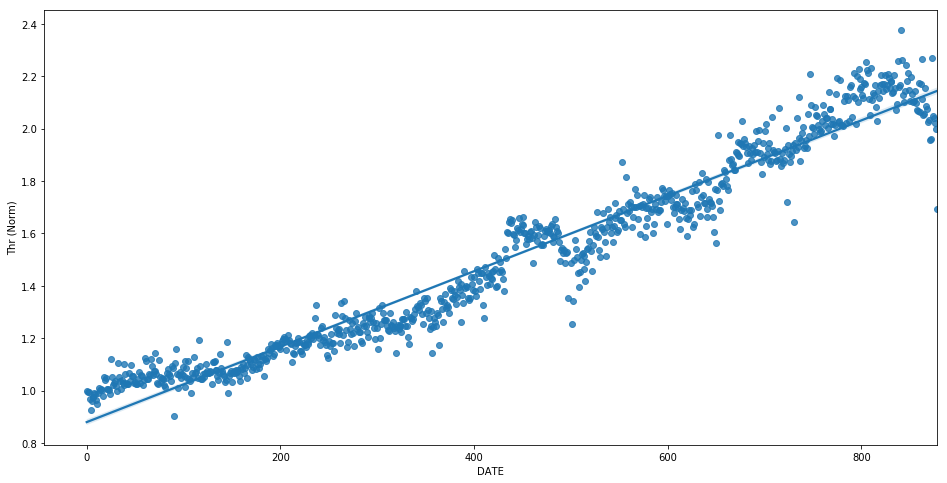

In [203]:
x0=dailypeaks.index[0].value
x=pd.Series(dailypeaks.index).apply(lambda x: (x.value-x0)/(3600*24*1e9))
plt.figure(figsize=(16,8))
sns.regplot( x=x, y=dailypeaks['Thr (Norm)'])

Then we save the file for later use and move to the next workbook (Sportevent)

In [204]:
nw_df.to_csv('C:\\Users\\rpaglin\\OneDrive - Vodafone Group\\Desktop\\Nanodegree prj1 data\\nw_df.csv')
